## Imports

In [ ]:
from pnpl.datasets import LibriBrainSpeech
from torch.utils.data import DataLoader


# We're only using data from
# - subject 0 (all LibriBrain data is from the same subject!)
# - session 1 (this represents chapter of the book)
# - task "Sherlock1" (meaning the first book of the cannon)
# - run 1 (collected in the first run)
# for now.
# We'll load more later!
example_data = LibriBrainSpeech(
  data_path=f"{base_path}/data/",
  include_run_keys = [("0","1","Sherlock1","1")],
  tmin=0.0,
  tmax=0.8,
  preload_files = True
)

# Conditionally set num_workers to avoid multiprocessing issues (try increasing if performance is problematic)
num_workers = 2 if in_colab else 0

example_loader = DataLoader(example_data, batch_size=32, shuffle=True, num_workers=num_workers)

print("Number of samples:", len(example_data))

/opt/miniconda3/envs/pytorch_env/lib/python3.13/site-packages/requests/__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


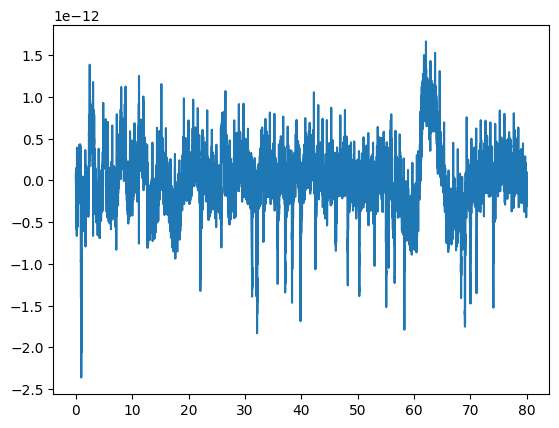

In [4]:
plt.plot(times[:20000], data[0, :20000])
plt.show()

#### Labels
Next, let's explore the labels. As you can see below, the data includes overlapping phoneme and word labels for each period of heard speech.
For the speech detection task, we only care about differentiating between *speech* (time where there is a "word" label) and *non-speech* (time where there is a "silence" label)

In [5]:
import pandas as pd

def explore_tsv(file_path):
    def format_series(series):
        if series.dtype in ['float64', 'int64']:
            return (f"Series(dtype={series.dtype}, min={series.min()}, "
                    f"max={series.max()}, mean={series.mean():.3e}, "
                    f"std={series.std():.3e})")
        elif series.dtype == 'object':
            unique_values = series.nunique()
            return (f"Series(dtype={series.dtype}, unique_values={unique_values})")
        else:
            return f"Series(dtype={series.dtype})"

    print("Structure of TSV file:")
    data = pd.read_csv(file_path, sep='\t')

    print(f"\nNumber of rows: {data.shape[0]}")
    print(f"Number of columns: {data.shape[1]}")
    print(f"\nColumns and Data Types:")
    for col in data.columns:
        print(f"  {col}: {format_series(data[col])}")

    print("\nSample Data:")
    print(data.head(n=20))

tsv_file_path = f"{base_path}/data/Sherlock1/derivatives/events/sub-0_ses-1_task-Sherlock1_run-1_events.tsv"
explore_tsv(tsv_file_path)

Structure of TSV file:

Number of rows: 12806
Number of columns: 12

Columns and Data Types:
  idx: Series(dtype=int64, min=1, max=12806, mean=6.404e+03, std=3.697e+03)
  wavile: Series(dtype=object, unique_values=1)
  kind: Series(dtype=object, unique_values=3)
  segment: Series(dtype=object, unique_values=1151)
  sentenceidx: Series(dtype=float64, min=0.0, max=187.0, mean=8.266e+01, std=5.399e+01)
  wordidx: Series(dtype=float64, min=0.0, max=41.0, mean=1.018e+01, std=8.414e+00)
  phonemeidx: Series(dtype=float64, min=0.0, max=12.0, mean=1.791e+00, std=1.918e+00)
  timemeg: Series(dtype=float64, min=28.772, max=1098.558, mean=5.645e+02, std=3.073e+02)
  timeds: Series(dtype=float64, min=28.772, max=1098.556, mean=5.645e+02, std=3.073e+02)
  timechapter: Series(dtype=float64, min=0.0, max=1064.6840000000002, mean=5.334e+02, std=3.058e+02)
  timesentence: Series(dtype=float64, min=0.0, max=14.57, mean=3.335e+00, std=2.799e+00)
  duration: Series(dtype=float64, min=0.01, max=2.616, mean

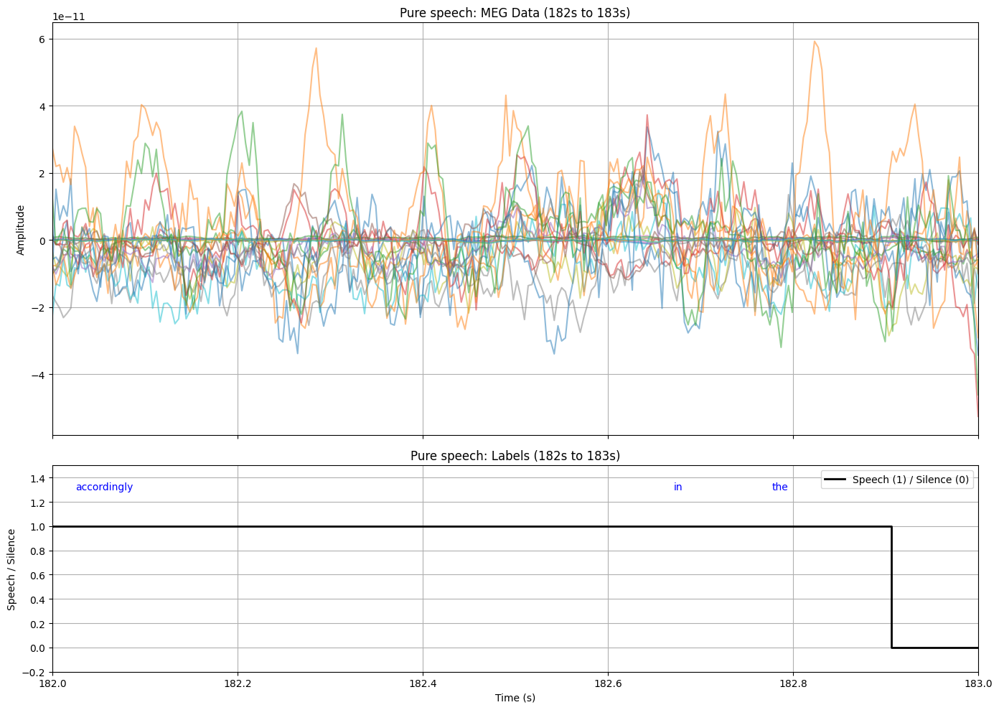

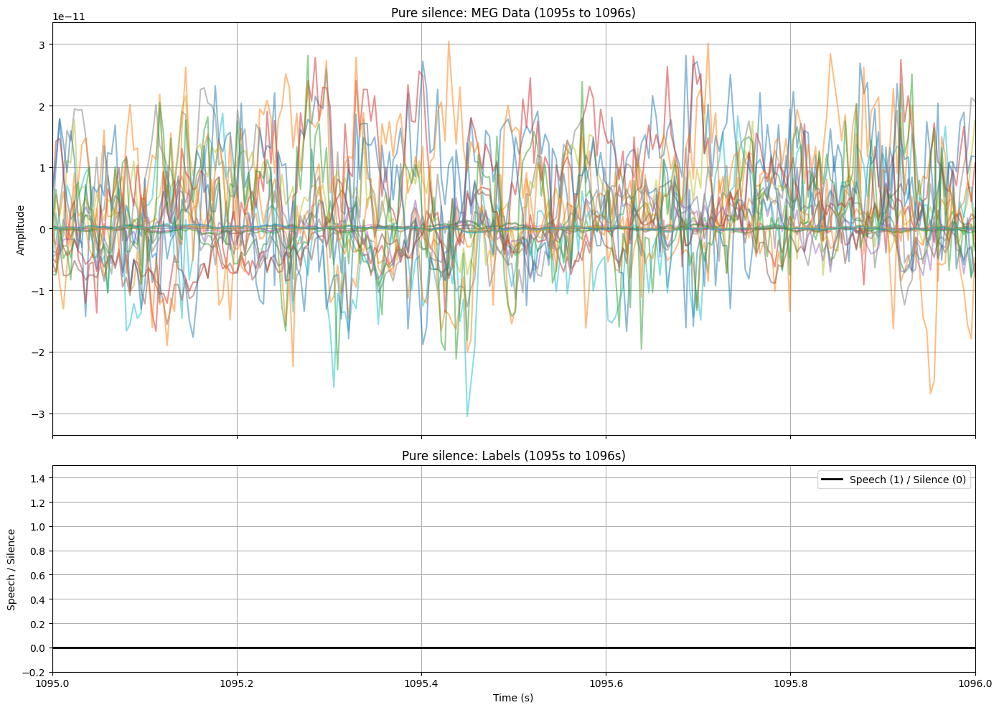

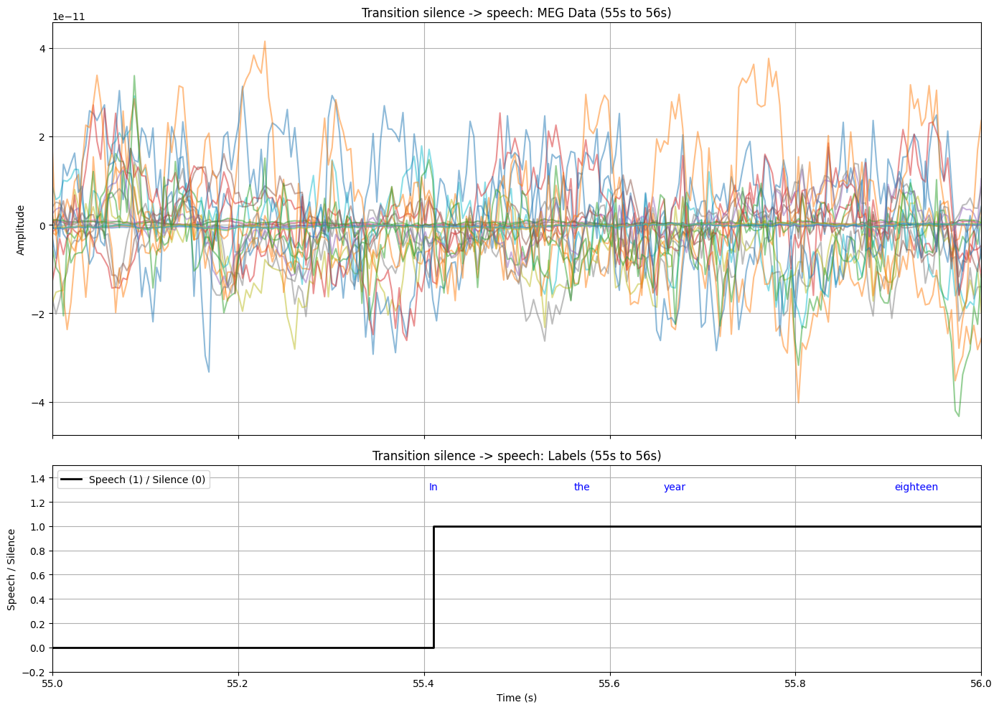

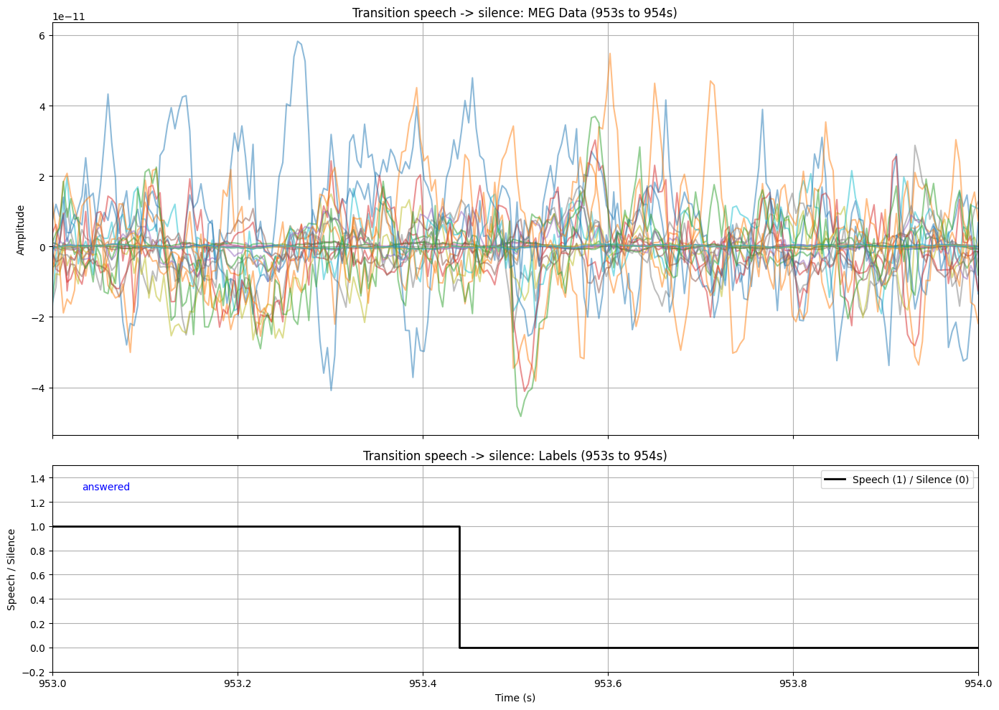

In [36]:
import pandas as pd
import h5py
from mne import create_info


def load_meg_data(hdf5_file_path):
    with h5py.File(hdf5_file_path, 'r') as f:
        raw_data = f['data'][:]
        times = f['times'][:]
    if len(times) >= 2:
        dt = times[1] - times[0]
        sfreq = 1.0 / dt
    else:
        raise ValueError("Not enough time points in 'times' to determine sampling frequency.")
    n_channels = raw_data.shape[0]
    # Create MNE Info object with default channel names.
    channel_names = [f'MEG {i+1:03d}' for i in range(n_channels)]
    info = create_info(ch_names=channel_names, sfreq=sfreq, ch_types=['mag'] * n_channels)
    return raw_data, info


def meg_label_visualization(tsv_data, meg_raw, info, start_time, end_time, title=None, show_phonemes=False, apply_sensor_mask=False):
    """
    Combine MEG data visualization and speech/silence labels.

    Parameters:
      - tsv_data: DataFrame with timing and labeling information.
      - meg_raw: MEG data array (channels x samples).
      - info: MNE Info object containing metadata (including sampling frequency).
      - start_time, end_time: Time window (in seconds) to visualize.
      - title: Optional title for the plots.
      - show_phonemes: Whether to show phoneme annotations.
      - apply_sensor_mask: force applying the sensor mask;
    """
    # --- Optionally apply sensor mask if using filtered data ---
    if apply_sensor_mask:
        try:
            meg_raw = meg_raw[SENSORS_SPEECH_MASK, :]
        except NameError:
            print("SENSORS_SPEECH_MASK is not defined. Proceeding without sensor mask.")

    # --- Process TSV data to build ground-truth labels ---
    tsv_data = tsv_data.copy()
    tsv_data['timemeg'] = tsv_data['timemeg'].astype(float)
    last_before = tsv_data[tsv_data['timemeg'] < start_time].iloc[-1:] # immediately preceding data
    # window of interest
    window_data = tsv_data[(tsv_data['timemeg'] >= start_time) & (tsv_data['timemeg'] <= end_time)]
    filtered_data = pd.concat([last_before, window_data]).sort_values('timemeg')
    if filtered_data.empty:
        filtered_data = pd.DataFrame({'timemeg': [start_time, end_time], 'speech_label': [0, 0]})
    filtered_data['speech_label'] = 0
    # combine word and phoneme labels for general 'speech' label
    filtered_data.loc[filtered_data['kind'].isin(['word', 'phoneme']), 'speech_label'] = 1

    first_value = filtered_data.iloc[0]['speech_label']
    plot_times = [start_time]
    plot_values = [first_value]
    plot_times.extend(filtered_data['timemeg'].tolist())
    plot_values.extend(filtered_data['speech_label'].tolist())
    plot_times.append(end_time)
    plot_values.append(plot_values[-1])
    plot_times = np.array(plot_times)
    plot_values = np.array(plot_values)

    # --- Extract the MEG segment ---
    sfreq = info['sfreq']
    start_sample = int(start_time * sfreq)
    end_sample = int(end_time * sfreq)
    meg_segment = meg_raw[:, start_sample:end_sample]  # shape: (channels, samples)
    time_points = np.linspace(start_time, end_time, meg_segment.shape[1])

    # --- Plotting ---
    fig, axs = plt.subplots(2, 1, figsize=(14, 10), gridspec_kw={'height_ratios': [2, 1]}, sharex=True)
    meg_title = f"{title}: MEG Data ({start_time}s to {end_time}s)" if title else f"MEG Data ({start_time}s to {end_time}s)"
    axs[0].plot(time_points, meg_segment.T, alpha=0.5)
    axs[0].set_title(meg_title)
    axs[0].set_ylabel('Amplitude')
    axs[0].grid(True)

    axs[1].plot(plot_times, plot_values, drawstyle='steps-post', label='Speech (1) / Silence (0)',
                linewidth=2, color='black')
    for _, row in filtered_data.iterrows():
        if pd.isna(row['kind']) or row['kind'] == 'silence':
            continue
        if pd.isna(row['timemeg']) or pd.isna(row['segment']):
            continue
        try:
            if row['kind'] == 'phoneme' and show_phonemes and start_time <= row['timemeg'] <= end_time:
                axs[1].text(row['timemeg'], 1.1, str(row['segment']), fontsize=9, rotation=45, ha='center')
            elif row['kind'] == 'word' and start_time <= row['timemeg'] <= end_time:
                axs[1].text(row['timemeg'], 1.3, str(row['segment']), fontsize=10, rotation=0, ha='center', color='blue')
        except Exception as e:
            print(f"Warning: Could not plot annotation at time {row['timemeg']}: {e}")

    axs[1].set_ylabel('Speech / Silence')
    labels_title = f"{title}: Labels ({start_time}s to {end_time}s)" if title else f"Labels ({start_time}s to {end_time}s)"
    axs[1].set_title(labels_title)
    axs[1].set_ylim(-0.2, 1.5)
    axs[1].set_xlim(start_time, end_time)
    axs[1].legend()
    axs[1].grid(True)
    axs[1].set_xlabel('Time (s)')

    plt.tight_layout()
    plt.show()


# Define your file paths (ensure that base_path is defined or replace with actual paths)
tsv_file_path = f"{base_path}/data/Sherlock1/derivatives/events/sub-0_ses-1_task-Sherlock1_run-1_events.tsv"
hdf5_file_path = f"{base_path}/data/Sherlock1/derivatives/serialised/sub-0_ses-1_task-Sherlock1_run-1_proc-bads+headpos+sss+notch+bp+ds_meg.h5"

# Load data from TSV and HDF5 files
tsv_data = pd.read_csv(tsv_file_path, sep='\t')
meg_raw, info = load_meg_data(hdf5_file_path)

# Pure speech
meg_label_visualization(tsv_data, meg_raw, info, start_time=182, end_time=183, title='Pure speech', apply_sensor_mask=True)

# Pure silence
meg_label_visualization(tsv_data, meg_raw, info, start_time=1095, end_time=1096, title='Pure silence', apply_sensor_mask=True)

# Transition silence -> speech
meg_label_visualization(tsv_data, meg_raw, info, start_time=55, end_time=56, title='Transition silence -> speech', apply_sensor_mask=True)

# Transition speech -> silence
meg_label_visualization(tsv_data, meg_raw, info, start_time=953, end_time=954, title='Transition speech -> silence', apply_sensor_mask=True)


While we are only doing a binary classification (speech/non-speech), there are actually four types of signals that might be interesting to look at:
- Pure speech
- Pure silence
- Transition from silence to speech
- Transition from speech to silence

Above, you can see examples of those types taken from the training data.

Note that you can opt into showing individual phonemes by setting `show_phonemes=True` for each of these.

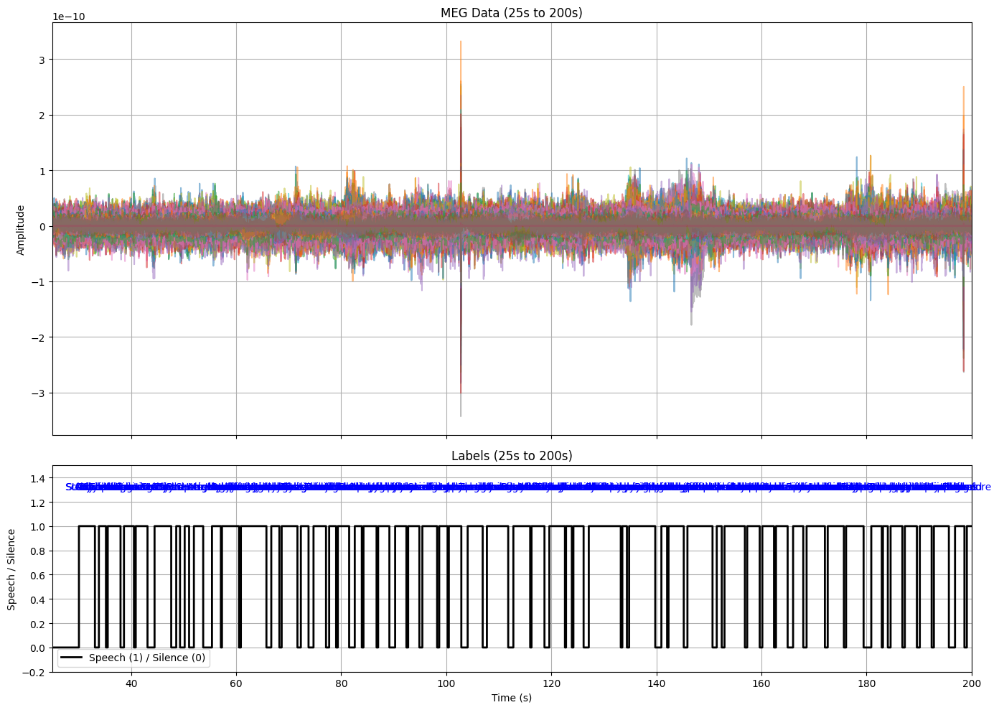

In [7]:
# take a look at a longer period of time
meg_label_visualization(tsv_data, meg_raw, info, start_time=25, end_time=200)

## Exploring the model

In [8]:
# Conditionally set num_workers to avoid multiprocessing issues (try increasing if performance is problematic)
num_workers = 0

# For training, we'll use sessions 1-10 of Sherlock1 and 1-13 of Sherlock2
train_run_keys = [("0",str(i),"Sherlock1","1") for i in range(1, 11)] + [("0",str(i),"Sherlock2","1") for i in range(1, 13) if i!=2]
train_data = LibriBrainSpeech(
  data_path=f"{base_path}/data/",
  include_run_keys = train_run_keys,
  tmin=0.0,
  tmax=0.8,
  preload_files = True
)
train_loader = DataLoader(train_data, batch_size=32, shuffle=True, num_workers=num_workers)


# For validation, we'll use session 11 of Sherlock1
val_data = LibriBrainSpeech(
  data_path=f"{base_path}/data/",
  include_run_keys=[("0","11","Sherlock1","2")],
  standardize=True,
  tmin=0.0,
  tmax=0.8,
  preload_files = True
)
val_loader = DataLoader(val_data, batch_size=32, shuffle=False, num_workers=num_workers)


# For testing, we'll use session 12 of Sherlock1
test_data = LibriBrainSpeech(
  data_path=f"{base_path}/data/",
  include_run_keys=[("0","12","Sherlock1","2")],
  standardize=True,
  tmin=0.0,
  tmax=0.8,
  preload_files = True
)
test_loader = DataLoader(test_data, batch_size=32, shuffle=False, num_workers=num_workers)


print("Number of training samples:", len(train_data))
print("Number of validation samples:", len(val_data))
print("Number of test samples:", len(test_data))

calculated stats for:  ('0', '2', 'Sherlock1', '1')
calculated stats for:  ('0', '3', 'Sherlock1', '1')
calculated stats for:  ('0', '4', 'Sherlock1', '1')
calculated stats for:  ('0', '5', 'Sherlock1', '1')
calculated stats for:  ('0', '6', 'Sherlock1', '1')
calculated stats for:  ('0', '7', 'Sherlock1', '1')
calculated stats for:  ('0', '8', 'Sherlock1', '1')
calculated stats for:  ('0', '9', 'Sherlock1', '1')
calculated stats for:  ('0', '10', 'Sherlock1', '1')
calculated stats for:  ('0', '1', 'Sherlock2', '1')
calculated stats for:  ('0', '3', 'Sherlock2', '1')
calculated stats for:  ('0', '4', 'Sherlock2', '1')
calculated stats for:  ('0', '5', 'Sherlock2', '1')
calculated stats for:  ('0', '6', 'Sherlock2', '1')
calculated stats for:  ('0', '7', 'Sherlock2', '1')
calculated stats for:  ('0', '8', 'Sherlock2', '1')
calculated stats for:  ('0', '9', 'Sherlock2', '1')
calculated stats for:  ('0', '10', 'Sherlock2', '1')
calculated stats for:  ('0', '11', 'Sherlock2', '1')
calculate

(…)0_ses-11_task-Sherlock1_run-2_events.tsv: 0.00B [00:00, ?B/s]

Sherlock1/derivatives/serialised/sub-0_s(…):   0%|          | 0.00/415M [00:00<?, ?B/s]

Done!
calculated stats for:  ('0', '11', 'Sherlock1', '2')


Sherlock1/derivatives/serialised/sub-0_s(…):   0%|          | 0.00/440M [00:00<?, ?B/s]

(…)0_ses-12_task-Sherlock1_run-2_events.tsv: 0.00B [00:00, ?B/s]

Done!
calculated stats for:  ('0', '12', 'Sherlock1', '2')
Number of training samples: 34262
Number of validation samples: 1671
Number of test samples: 1772


In our experience, however, it can pay off to take some time to do additional preparation, so let's do that next.


#### Simplifying the prediction task
As it stands, the dataset expects the model to predict 200 labels per sample - one for every timestep in the input (remember that each sample is composed of 0.8s of data at 250Hz, each containing the sensor values of 306 sensors at that point in time).

Turns out, this is a pretty hard task to learn. So instead, what if the model only had to produce a single prediction per sample — specifically, whether the middle time point in a 200-sample corresponds to speech or not? The input would still be the full 0.8 seconds of MEG data (i.e., 200 time steps), but the model’s output would now be a single label for the central time step. This doesn’t mean we lose the ability to predict labels for all time points. Instead, we can slide a 200-sample “window” across the recording, one timestep at a time, making a prediction for the center of each sample window. In this way, the model still makes predictions for all timesteps, but each one is made with context from both the past and future.

#### Sensor masking
We identified some sensors that provided more activity at relevant frequencies than others during speech periods.
In our experience, only including these sensors in training can lead to improved results. These empirical results track with prior research showing these areas as being important for speech processing.
Note that you can visualize "our" mask in the sensor location visualization above.

Take a look at the comparison below - this does look much more managable, right? (Right-click -> New Tab if the text is too small to read)

![Task comparison](https://neural-processing-lab.github.io/2025-libribrain-competition/speech-colab-task-comparison.png)

We've implemented both of these adaptions into the `FilteredDataset` below, which is the dataset we'll use for training.

In [9]:
import random
import torch
from torch.utils.data import DataLoader
import platform

# These are the sensors we identified as being particularly useful
SENSORS_SPEECH_MASK = [18, 20, 22, 23, 45, 120, 138, 140, 142, 143, 145,
                       146, 147, 149, 175, 176, 177, 179, 180, 198, 271, 272, 275]

class FilteredDataset(torch.utils.data.Dataset):
    """
    Parameters:
        dataset: LibriBrain dataset.
        limit_samples (int, optional): If provided, limits the length of the dataset to this
                          number of samples.
        speech_silence_only (bool, optional): If True, only includes segments that are either
                          purely speech or purely silence (with additional balancing).
        apply_sensors_speech_mask (bool, optional): If True, applies a fixed sensor mask to the sensor
                          data in each sample.
    """
    def __init__(self,
                 dataset,
                 limit_samples=None,
                 disable=False,
                 apply_sensors_speech_mask=True):
        self.dataset = dataset
        self.limit_samples = limit_samples
        self.apply_sensors_speech_mask = apply_sensors_speech_mask

        # These are the sensors we identified:
        self.sensors_speech_mask = SENSORS_SPEECH_MASK

        self.balanced_indices = list(range(len(dataset.samples)))
        # Shuffle the indices
        self.balanced_indices = random.sample(self.balanced_indices, len(self.balanced_indices))

    def __len__(self):
        """Returns the number of samples in the filtered dataset."""
        if self.limit_samples is not None:
            return self.limit_samples
        return len(self.balanced_indices)

    def __getitem__(self, index):
        # Map index to the original dataset using balanced indices
        original_idx = self.balanced_indices[index]
        if self.apply_sensors_speech_mask:
            sensors = self.dataset[original_idx][0][self.sensors_speech_mask]
        else:
            sensors = self.dataset[original_idx][0][:]
        label_from_the_middle_idx = self.dataset[original_idx][1].shape[0] // 2
        return [sensors, self.dataset[original_idx][1][label_from_the_middle_idx]]


# Conditionally set num_workers to avoid multiprocessing issues (try increasing if performance is problematic)
num_workers = 0

print("Filtered dataset:")
train_data_filtered = FilteredDataset(train_data)
train_loader_filtered = DataLoader(train_data_filtered, batch_size=32, shuffle=True, num_workers=num_workers)
print(f"Train data contains {len(train_data_filtered)} samples")

val_data_filtered = FilteredDataset(val_data)
val_loader_filtered = DataLoader(val_data_filtered, batch_size=32, shuffle=False, num_workers=num_workers)
print(f"Validation data contains {len(val_data_filtered)} samples")

test_data_filtered = FilteredDataset(test_data)
test_loader_filtered = DataLoader(test_data_filtered, batch_size=32, shuffle=False, num_workers=num_workers)
print(f"Test data contains {len(test_data_filtered)} samples\n")

# Let's look at the first batch:
first_batch = next(iter(train_loader_filtered))
inputs, labels = first_batch
print("Batch input shape:", inputs.shape)
print("Batch label shape:", labels.shape)

first_input = inputs[0]
first_label = labels[0]
print("\nSingle sample input shape:", first_input.shape)
print("Single sample label is just a single value now!")
print("\nFirst sample input:", first_input)
print("First sample label:", first_label)


Filtered dataset:
Train data contains 34262 samples
Validation data contains 1671 samples
Test data contains 1772 samples

Batch input shape: torch.Size([32, 23, 200])
Batch label shape: torch.Size([32])

Single sample input shape: torch.Size([23, 200])
Single sample label is just a single value now!

First sample input: tensor([[-0.0770, -0.0226,  0.0892,  ..., -0.0082,  0.0180,  0.0530],
        [ 0.0902,  0.2579,  0.4191,  ...,  0.5244,  0.5204,  0.4957],
        [ 0.1485,  0.2356,  0.2857,  ...,  0.3697,  0.3569,  0.3896],
        ...,
        [-0.1667, -0.0179,  0.0053,  ...,  0.0660,  0.0391,  0.1228],
        [ 0.0131,  0.0013,  0.0093,  ...,  0.0074,  0.0143,  0.0278],
        [ 0.0527,  0.2083,  0.4254,  ...,  0.1762,  0.1676,  0.3235]])
First sample label: tensor(0)


### Actual training loop
With all that out of the way, let's actually train the model! First, we define the actual model architecture. We will use a 1 Dimensional Convolutional layer - to process the spatial relations between the sensors, followed by a 2 layer LSTM to process the temporal dynamics within each segment.

In [10]:
import torch.nn as nn


class SpeechModel(nn.Module):
    """
    Parameters:
        input_dim (int): Number of channels/features in the input tensor (usually SENSORS_SPEECH_MASK)
        model_dim (int): Dimensionality for the intermediate model representation.
        dropout_rate (float, optional): Dropout probability applied after convolutional and LSTM layers.
        lstm_layers (int, optional): Number of layers in the LSTM module.
        bi_directional (bool, optional): If True, uses a bidirectional LSTM; otherwise, a unidirectional LSTM.
        batch_norm (bool, optional): Indicates whether to use batch normalization.

    """
    def __init__(self, input_dim, model_dim, dropout_rate=0.3, lstm_layers = 1, bi_directional = False, batch_norm=False):
        super().__init__()
        self.conv = nn.Conv1d(
            in_channels=input_dim,
            out_channels=model_dim,
            kernel_size=3,
            padding=1,
        )
        self.lstm_layers = lstm_layers
        self.batch_norm = nn.BatchNorm1d(num_features=model_dim) if batch_norm else nn.Identity()
        self.conv_dropout = nn.Dropout(p=dropout_rate)
        self.lstm = nn.LSTM(
            input_size=model_dim,
            hidden_size=model_dim,
            num_layers=self.lstm_layers,
            dropout=dropout_rate,
            batch_first=True,
            bidirectional=bi_directional
        )
        self.lstm_dropout = nn.Dropout(p=dropout_rate)
        self.speech_classifier = nn.Linear(model_dim, 1)

    def forward(self, x):
        x = self.conv(x)
        x = self.batch_norm(x)
        x = self.conv_dropout(x)
        # LSTM expects (batch, seq_len, input_size)
        output, (h_n, c_n) = self.lstm(x.permute(0, 2, 1))
        last_layer_h_n = h_n
        if self.lstm_layers > 1:
            # handle more than one layer
            last_layer_h_n = h_n[-1, :, :]
            last_layer_h_n = last_layer_h_n.unsqueeze(0)
        output = self.lstm_dropout(last_layer_h_n)
        output = output.flatten(start_dim=0, end_dim=1)
        x = self.speech_classifier(output)
        return x

Next, let's wrap the model in a [LightningModule](https://lightning.ai/docs/pytorch/LTS/common/lightning_module.html) to save ourselves from some boilerplate.
This is also where we define our loss function (BCE with label smoothing) and optimizer (AdamW).

In [11]:
import lightning as L
import torch
import torch.nn as nn
import torchmetrics
from sklearn.metrics import roc_curve, auc, balanced_accuracy_score, jaccard_score
from torchmetrics import Precision, Recall, F1Score
from lightning.pytorch.callbacks import Callback
import numpy as np
from torchmetrics.functional import recall


class SpeechClassifier(L.LightningModule):
    """
    Parameters:
        input_dim (int): Number of input channels/features. This is passed to the underlying SpeechModel.
        model_dim (int): Dimensionality of the intermediate model representation.
        learning_rate (float, optional): Learning rate for the optimizer.
        weight_decay (float, optional): Weight decay for the optimizer.
        batch_size (int, optional): Batch size used during training and evaluation.
        dropout_rate (float, optional): Dropout probability applied after convolutional and LSTM layers.
        smoothing (float, optional): Label smoothing factor applied in the BCEWithLogits loss.
        pos_weight (float, optional): Weight for the positive class in the BCEWithLogits loss.
        batch_norm (bool, optional): Indicates whether to use batch normalization.
        lstm_layers (int, optional): Number of layers in the LSTM module within the SpeechModel.
        bi_directional (bool, optional): If True, uses a bidirectional LSTM in the SpeechModel; otherwise, uses a unidirectional LSTM.
    """

    def __init__(self, input_dim, model_dim, learning_rate=1e-3, weight_decay=0.01, batch_size=32, dropout_rate=0.3, smoothing=0.1, pos_weight = 1.0 , batch_norm = False, lstm_layers = 1, bi_directional = False):
        super().__init__()
        self.save_hyperparameters()

        self.learning_rate = learning_rate
        self.weight_decay = weight_decay
        self.batch_size = batch_size
        self.model = SpeechModel(input_dim, model_dim, dropout_rate=dropout_rate, lstm_layers=lstm_layers, bi_directional=bi_directional, batch_norm=batch_norm)

        self.loss_fn = BCEWithLogitsLossWithSmoothing(smoothing=smoothing, pos_weight = pos_weight)

        self.val_step_outputs = []
        self.test_step_outputs = {}


    def forward(self, x):
            return self.model(x)

    def _shared_eval_step(self, batch, stage):
        x = batch[0]
        y = batch[1] # (batch, seq_len)

        logits = self(x)
        loss = self.loss_fn(logits, y.unsqueeze(1).float())
        probs = torch.sigmoid(logits)
        y_probs = probs.detach().cpu()

        y_true = batch[1].detach().cpu()
        meg = x.detach().cpu()

        self.log(f'{stage}_loss', loss, on_step=False, on_epoch=True, batch_size=self.batch_size)
        return loss


    def training_step(self, batch, batch_idx):
        return self._shared_eval_step(batch, "train")


    def validation_step(self, batch, batch_idx):
        return self._shared_eval_step(batch, "val")


    def test_step(self, batch, batch_idx):
        x = batch[0]
        y = batch[1]  # (batch, seq_len)

        # ugly, taking care of only one label
        if len(y.shape) != 1:
            y = y.flatten(start_dim=0, end_dim=1).view(-1, 1)  # (batch, seq_len) -> (batch * seq_len, 1)
        else:
            y = y.unsqueeze(1)

        logits = self(x)
        loss = self.loss_fn(logits, y.float())
        probs = torch.sigmoid(logits)

        # Append data to the defaultdict
        # Ensure keys exist before appending
        if "y_probs" not in self.test_step_outputs:
            self.test_step_outputs["y_probs"] = []
        if "y_true" not in self.test_step_outputs:
            self.test_step_outputs["y_true"] = []
        if "meg" not in self.test_step_outputs:
            self.test_step_outputs["meg"] = []

        # Append data
        if y.shape[-1] != 1:
            self.test_step_outputs["y_probs"].extend(
                probs.detach().view(x.shape[0], x.shape[-1]).cpu())  # (batch, seq_len)
        else:
            self.test_step_outputs["y_probs"].extend(
                probs.detach().view(x.shape[0], 1).cpu())  # (batch, seq_len)

        self.test_step_outputs["y_true"].extend(batch[1].detach().cpu())  # (batch, seq_len)
        self.test_step_outputs["meg"].extend(x.detach().cpu())  # MEG data (batch, channels, seq_len)

        return self._shared_eval_step(batch, "test")

    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=self.learning_rate, weight_decay=self.weight_decay)
        return optimizer


class BCEWithLogitsLossWithSmoothing(nn.Module):
    def __init__(self, smoothing=0.1, pos_weight = 1.0):
        """
        Binary Cross-Entropy Loss with Deterministic Label Smoothing.

        Parameters:
            smoothing (float): Smoothing factor. Must be between 0 and 1.
            pos_weight (float): Weight for the positive class.
        """
        super().__init__()
        self.smoothing = smoothing
        self.bce_loss = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]))

    def forward(self, logits, target):
        target = target.float()  # Ensure target is a float tensor
        target_smoothed = target * (1 - self.smoothing) + self.smoothing * 0.5
        return self.bce_loss(logits, target_smoothed)

Finally, here's the training loop. We'll either use a basic CSVLogger when running locally or the built-in Tensorboard in Colab for logging to keep things self-contained.

In [12]:
import os
import lightning as L
from lightning.pytorch.loggers import TensorBoardLogger, CSVLogger
from lightning.pytorch.callbacks import EarlyStopping


# Setup paths for logs and checkpoints
LOG_DIR = f"{base_path}/lightning_logs"
CHECKPOINT_PATH = f"{base_path}/models/speech_model.ckpt"

# Minimal logging setup
logger = CSVLogger(
    save_dir=LOG_DIR,
    name="",
    version=None,
)
# Set a fixed seed for reproducibility
L.seed_everything(42)

# Initialize the SpeechClassifier model
model = SpeechClassifier(
    input_dim=23,
    model_dim=100,
    learning_rate=1e-3,
    dropout_rate=0.5,
    lstm_layers=2,
    weight_decay=0.01,
    batch_norm=False,
    bi_directional=False
)

# Log Hyperparameters
logger.log_hyperparams(model.hparams)


Seed set to 42


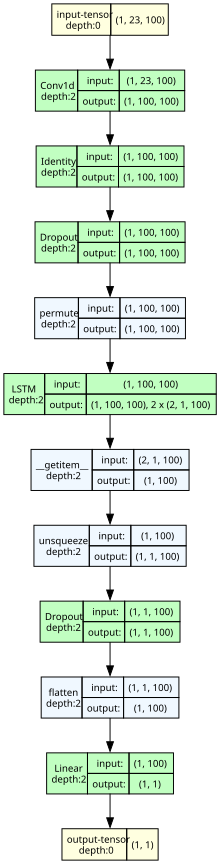

In [33]:
from torchview import draw_graph


# device='meta' -> no memory is consumed for visualization
model_graph = draw_graph(model, input_size=(1, 23, 100), device='meta')
model_graph.visual_graph

array([[-3.5874353e-17, -2.1509460e-13,  9.2436936e-14, ...,
         5.1477390e-12,  4.2755088e-12,  5.1459852e-12],
       [ 5.3139814e-16,  4.3802184e-12,  2.1201580e-12, ...,
         3.1967601e-10,  2.7351199e-10,  3.4351191e-10],
       [ 7.0220260e-16,  2.2623589e-12,  3.7938021e-12, ...,
        -3.3079589e-10, -2.8242153e-10, -3.6344866e-10],
       ...,
       [ 1.3276075e-16,  6.2856477e-15,  5.6007926e-14, ...,
        -4.4867152e-11, -3.8516482e-11, -4.8484227e-11],
       [ 5.2197791e-15, -1.5384942e-11, -1.6338595e-11, ...,
        -5.0524993e-09, -4.3709107e-09, -5.5007172e-09],
       [ 9.7651231e-16,  4.4307487e-12,  5.8265411e-12, ...,
         8.9335500e-10,  7.6611251e-10,  9.6386166e-10]],
      shape=(306, 278000), dtype=float32)